# Imports

In [126]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
# %matplotlib inline
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from pmdarima.metrics import smape

import pmdarima as pm
print(f"Using pmdarima {pm.__version__}")
# Using pmdarima 1.5.2

Using pmdarima 2.0.4


# All data

In [112]:
data = pd.read_parquet("Data/DSB_BDK_trainingset.parquet")
togpunktlighed_daily = data.groupby('dato')['togpunktlighed'].mean().reset_index()

In [4]:
# Split data
train_len = int(togpunktlighed_daily.shape[0] * 0.8)
train_data, test_data = togpunktlighed_daily[:train_len], togpunktlighed_daily[train_len:]

y_train = train_data['togpunktlighed'].values
y_test = test_data['togpunktlighed'].values

print(f"{train_len} train samples")
print(f"{togpunktlighed_daily.shape[0] - train_len} test samples")

2045 train samples
512 test samples


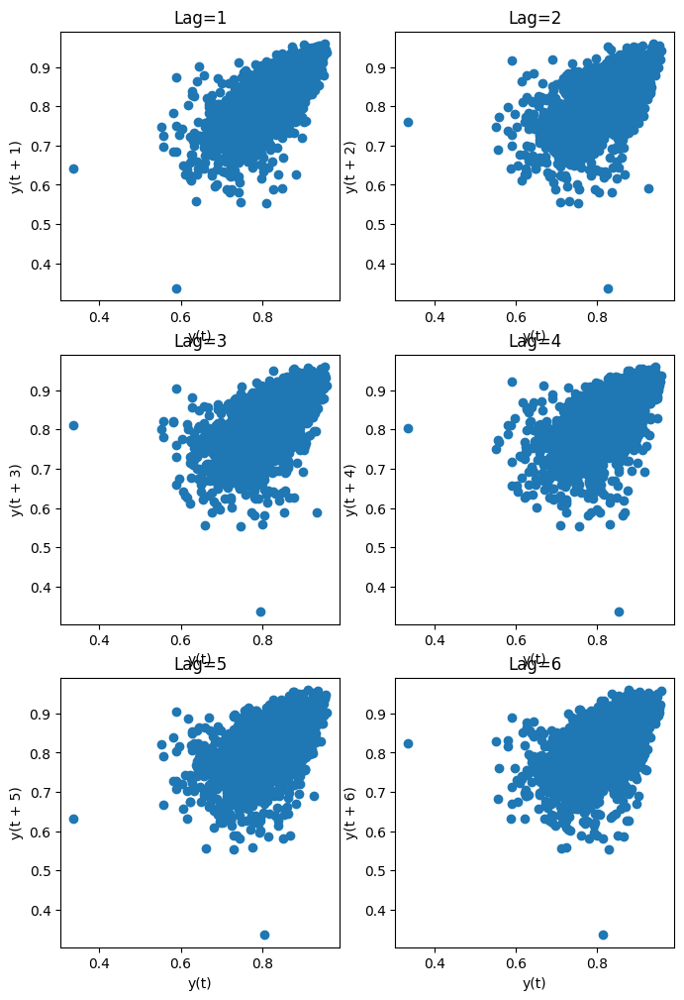

In [5]:
# Pre-modeling analysis - Lag plots
from pandas.plotting import lag_plot

fig, axes = plt.subplots(3, 2, figsize=(8, 12))
plt.title('MSFT Autocorrelation plot')

# The axis coordinates for the plots
ax_idcs = [
    (0, 0),
    (0, 1),
    (1, 0),
    (1, 1),
    (2, 0),
    (2, 1)
]

for lag, ax_coords in enumerate(ax_idcs, 1):
    ax_row, ax_col = ax_coords
    axis = axes[ax_row][ax_col]
    lag_plot(togpunktlighed_daily['togpunktlighed'], lag=lag, ax=axis)
    axis.set_title(f"Lag={lag}")

plt.show()

In [6]:
# Pre-modeling analysis - Estimanting the differencing term
from pmdarima.arima import ndiffs
kpss_diffs = ndiffs(y_train, alpha=0.05, test='kpss', max_d=365)
adf_diffs = ndiffs(y_train, alpha=0.05, test='adf', max_d=365)
n_diffs = max(adf_diffs, kpss_diffs)

print(f"Estimated differencing term: {n_diffs}")
# Estimated differencing term: 1

Estimated differencing term: 1


In [7]:
# Fit a model
auto = pm.auto_arima(y_train, d=n_diffs, seasonal=False, stepwise=True,
                     suppress_warnings=True, error_action="ignore", max_p=6,
                     max_order=None, trace=True)

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=-7265.669, Time=0.58 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=-6683.776, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=-6890.636, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=-7143.670, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=-6685.775, Time=0.07 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=-7246.212, Time=0.39 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=-7262.787, Time=0.72 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=-7253.813, Time=0.27 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=-7263.928, Time=0.85 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=-7264.767, Time=0.48 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=-7253.491, Time=0.84 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=-7266.449, Time=0.70 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=-7110.738, Time=0.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=-7267.532, Time=0.89 sec
 ARIMA(4,1,0)(0,0,0

## Next estimate from earlier estimates

In [8]:
from sklearn.metrics import mean_squared_error
from pmdarima.metrics import smape

model = auto

def forecast_one_step():
    fc, conf_int = model.predict(n_periods=1, return_conf_int=True)
    return (
        fc.tolist()[0],
        np.asarray(conf_int).tolist()[0])

forecasts = []
confidence_intervals = []

for new_ob in y_test:
    fc, conf = forecast_one_step()
    forecasts.append(fc)
    confidence_intervals.append(conf)
    
    # Updates the existing model with a small number of MLE steps
    model.update(new_ob)
    
print(f"Mean squared error: {mean_squared_error(y_test, forecasts)}")
print(f"SMAPE: {smape(y_test, forecasts)}")

Mean squared error: 0.0027223348528182473
SMAPE: 5.1887328486376


In [9]:
togpunktlighed_daily['year'] = togpunktlighed_daily['dato'].dt.strftime('%Y')

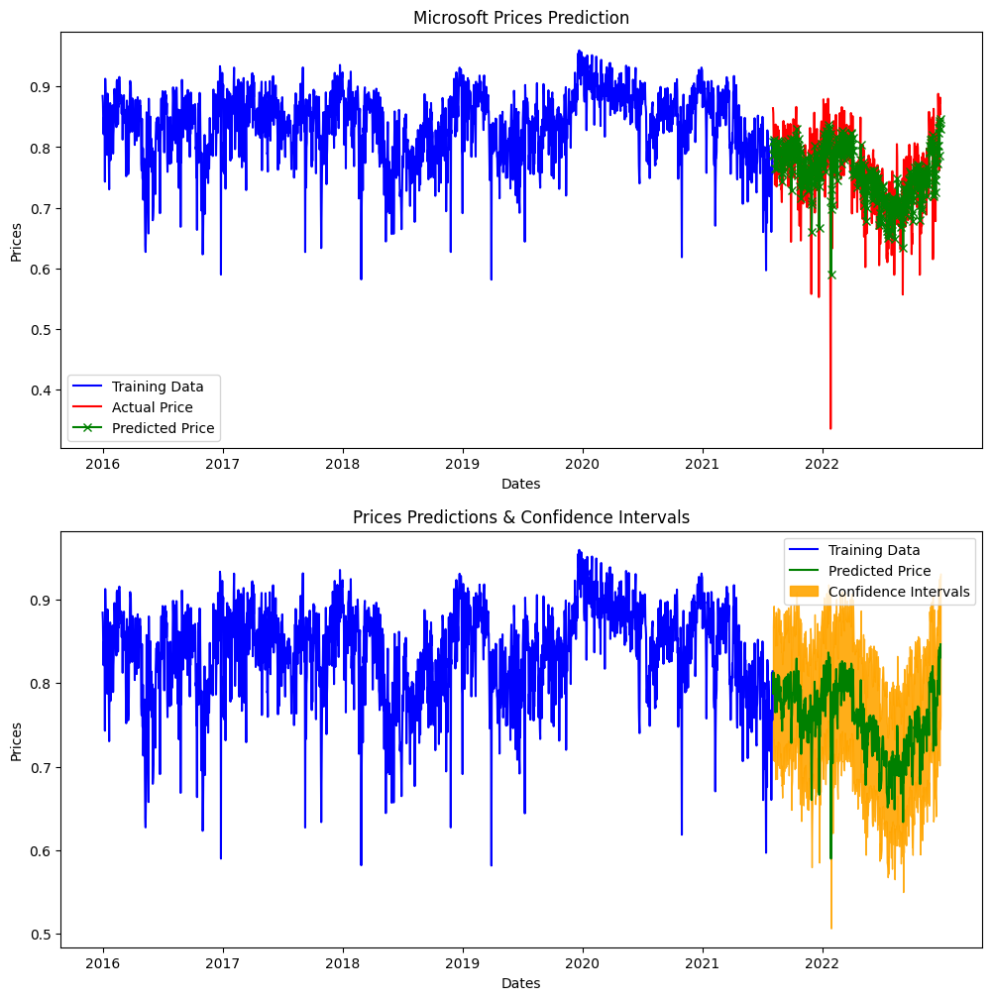

In [10]:
fig, axes = plt.subplots(2, 1, figsize=(12, 12))

# --------------------- Actual vs. Predicted --------------------------
axes[0].plot(y_train, color='blue', label='Training Data')
axes[0].plot(test_data.index, y_test, color='red', label='Actual Price')
axes[0].plot(test_data.index, forecasts, color='green', marker='x',
             label='Predicted Price')
axes[0].set_title('Microsoft Prices Prediction')
axes[0].set_xlabel('Dates')
axes[0].set_ylabel('Prices')

axes[0].set_xticks(np.arange(0, 2557, 366).tolist(), togpunktlighed_daily['year'][0:2600:366].tolist())
axes[0].legend()


# ------------------ Predicted with confidence intervals ----------------
axes[1].plot(y_train, color='blue', label='Training Data')
axes[1].plot(test_data.index, forecasts, color='green',
             label='Predicted Price')

axes[1].set_title('Prices Predictions & Confidence Intervals')
axes[1].set_xlabel('Dates')
axes[1].set_ylabel('Prices')

conf_int = np.asarray(confidence_intervals)
axes[1].fill_between(test_data.index,
                     conf_int[:, 0], conf_int[:, 1],
                     alpha=0.9, color='orange',
                     label="Confidence Intervals")

axes[1].set_xticks(np.arange(0, 2557, 366).tolist(), togpunktlighed_daily['year'][0:2600:366].tolist())
axes[1].legend()

## Next estimate based on true value

In [11]:
# Update with estimate instead of true value
from sklearn.metrics import mean_squared_error
from pmdarima.metrics import smape

model = auto

def forecast_one_step():
    fc, conf_int = model.predict(n_periods=1, return_conf_int=True)
    return (
        fc.tolist()[0],
        np.asarray(conf_int).tolist()[0])

forecasts = []
confidence_intervals = []

for new_ob in y_test:
    fc, conf = forecast_one_step()
    forecasts.append(fc)
    confidence_intervals.append(conf)
    
    # Updates the existing model with a small number of MLE steps
    model.update(fc)
    
print(f"Mean squared error: {mean_squared_error(y_test, forecasts)}")
print(f"SMAPE: {smape(y_test, forecasts)}")

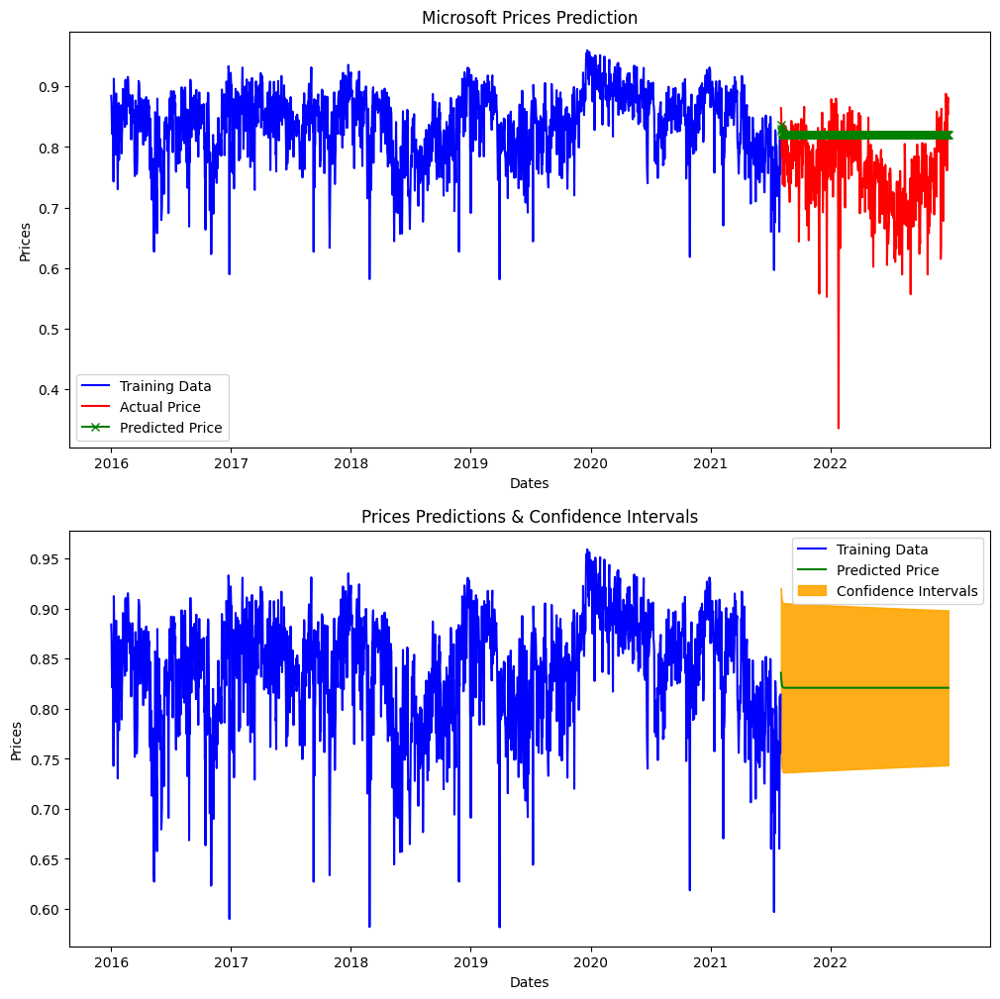

In [ ]:
fig, axes = plt.subplots(2, 1, figsize=(12, 12))

# --------------------- Actual vs. Predicted --------------------------
axes[0].plot(y_train, color='blue', label='Training Data')
axes[0].plot(test_data.index, y_test, color='red', label='Actual Price')
axes[0].plot(test_data.index, forecasts, color='green', marker='x',
             label='Predicted Price')
axes[0].set_title('Microsoft Prices Prediction')
axes[0].set_xlabel('Dates')
axes[0].set_ylabel('Prices')

axes[0].set_xticks(np.arange(0, 2557, 366).tolist(), togpunktlighed_daily['year'][0:2600:366].tolist())
axes[0].legend()


# ------------------ Predicted with confidence intervals ----------------
axes[1].plot(y_train, color='blue', label='Training Data')
axes[1].plot(test_data.index, forecasts, color='green',
             label='Predicted Price')

axes[1].set_title('Prices Predictions & Confidence Intervals')
axes[1].set_xlabel('Dates')
axes[1].set_ylabel('Prices')

conf_int = np.asarray(confidence_intervals)
axes[1].fill_between(test_data.index,
                     conf_int[:, 0], conf_int[:, 1],
                     alpha=0.9, color='orange',
                     label="Confidence Intervals")

axes[1].set_xticks(np.arange(0, 2557, 366).tolist(), togpunktlighed_daily['year'][0:2600:366].tolist())
axes[1].legend()

# Per strækning

In [127]:
# Load data
data = pd.read_parquet("Data/DSB_BDK_trainingset.parquet")
togpunktlighed_daily = data.groupby('dato')['togpunktlighed'].mean().reset_index()

In [128]:
# Choose togpunktlighed per strækning and split into test and train set
def togpunktlighed_strækning_split(strækning, ratio=0.1):
    strækning_data = data[data['visualiseringskode'] == strækning]
    togpunktlighed_strækning_daily = strækning_data.groupby('dato')['togpunktlighed'].mean().reset_index()
    train, test = train_test_split(togpunktlighed_strækning_daily, test_size=ratio, shuffle=False)
    return train,test

# Choose togpunktlighed per strækning and split into test and train set
def togpunktlighed_station_split(station, ratio=0.1):
    station_data = data[data['station'] == station]
    togpunktlighed_station_daily = station_data.groupby('dato')['togpunktlighed'].mean().reset_index()
    train, test = train_test_split(togpunktlighed_station_daily, test_size=ratio, shuffle=False)
    return train,test

# Model predictions one step into the future. Returns predictions and confidence interval
def forecast_one_step():
    fc, conf_int = model.predict(n_periods=1, return_conf_int=True)
    return (
        fc.tolist()[0],
        np.asarray(conf_int).tolist()[0])

# Plots the results
togpunktlighed_daily['year'] = togpunktlighed_daily['dato'].dt.strftime('%Y')

def plotting_results(strækning, y_train, y_test, forecasts, confidence_intervals):
    fig, axes = plt.subplots(1, 2, figsize=(20, 8))

# --------------------- Actual vs. Predicted --------------------------
    axes[0].plot(y_train, color='blue', label='Training Data')
    axes[0].plot(y_test.index, y_test, color='red', label='Test Data')
    axes[0].plot(y_test.index, forecasts, color='green', marker='x',
             label='Predictions')
    axes[0].set_title(f'Strækning {strækning}: Predictions & True Value')
    axes[0].set_xlabel('Dates')
    axes[0].set_ylabel('Togpunktlighed')

    axes[0].set_xticks(np.arange(0, y_train.shape[0]+y_test.shape[0], 366).tolist(), togpunktlighed_daily['year'][0:y_train.shape[0]+y_test.shape[0]:366].tolist())
    axes[0].legend(loc='lower left')


# ------------------ Predicted with confidence intervals ----------------
    axes[1].plot(y_train, color='blue', label='Training Data')
    axes[1].plot(y_test.index, forecasts, color='green',
             label='Predicted Values')

    axes[1].set_title(f'Strækning {strækning}: Predictions & Confidence Intervals')
    axes[1].set_xlabel('Dates')
    axes[1].set_ylabel('Togpunktlighed')
    conf_int = np.asarray(confidence_intervals)
    axes[1].fill_between(y_test.index,
                     conf_int[:, 0], conf_int[:, 1],
                     alpha=0.9, color='orange',
                     label="Confidence Intervals")

    axes[1].set_xticks(np.arange(0, 2557, 366).tolist(), togpunktlighed_daily['year'][0:2600:366].tolist())
    axes[1].legend(loc='lower left')

In [129]:
data_each_strækning = {}
for strækning in np.sort(data['visualiseringskode'].unique()):
    train, test = togpunktlighed_strækning_split(strækning, ratio=0.1)
    y_train, y_test = train['togpunktlighed'], test['togpunktlighed']

    model = pm.auto_arima(y_train, d=1, seasonal=False, stepwise=True,
                     suppress_warnings=True, error_action="ignore", max_p=6,
                     max_order=None, trace=True)
    forecasts = []
    confidence_intervals = []

    for new_ob in y_test:
        fc, conf = forecast_one_step()
        forecasts.append(fc)
        confidence_intervals.append(conf)
        
        # Updates the existing model with a small number of MLE steps
        model.update(new_ob)
    results = [y_train, y_test, forecasts, confidence_intervals, model, mean_squared_error(y_test, forecasts), smape(y_test, forecasts)]
    data_each_strækning[strækning] = results
    print(f"Mean squared error: {mean_squared_error(y_test, forecasts)}")

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=-4955.520, Time=0.85 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=-4472.498, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=-4677.045, Time=0.18 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=-4868.123, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=-4474.498, Time=0.05 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=-4956.147, Time=0.78 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=-4954.233, Time=0.51 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=-4957.249, Time=0.58 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=-4955.917, Time=0.71 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=-4818.450, Time=0.23 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=-4959.243, Time=0.18 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=-4870.119, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=-4679.045, Time=0.09 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=-4957.911, Time=0.28 sec
 ARIMA(1,1,2)(0,0,0

/var/folders/_6/l3776shn2kq8j4f7hm3qr5bh0000gn/T/ipykernel_1385/2587770143.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(1, 2, figsize=(20, 8))


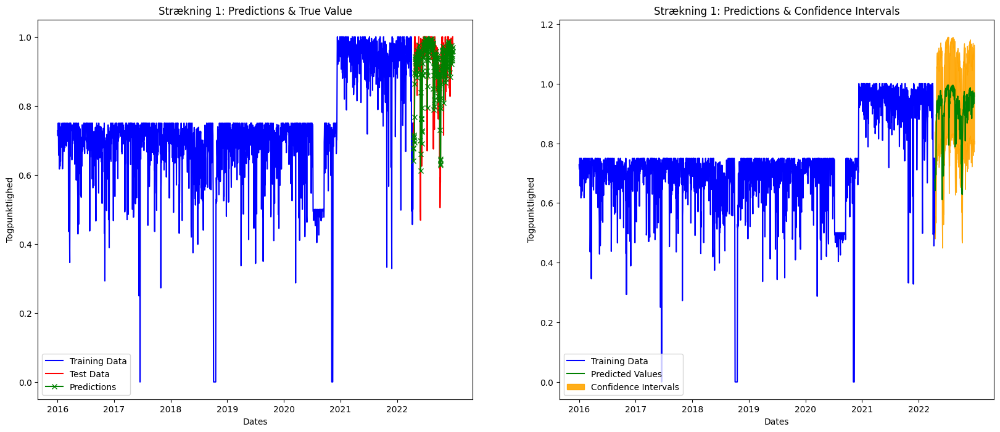

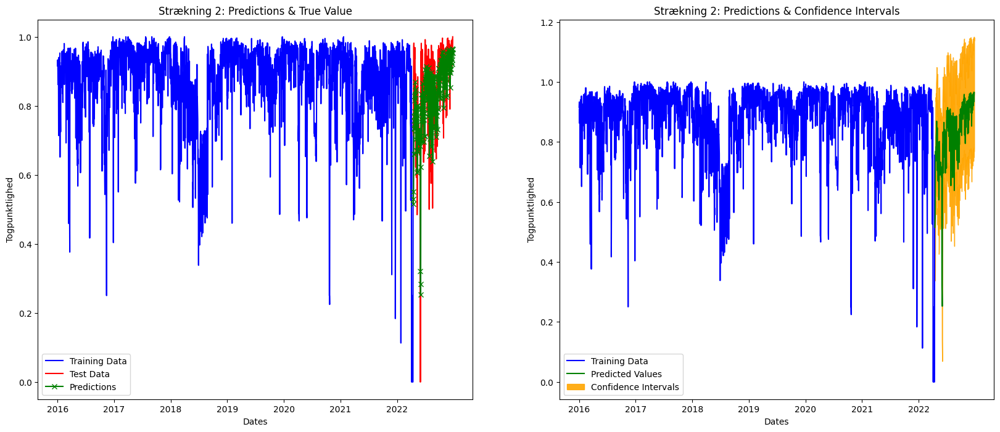

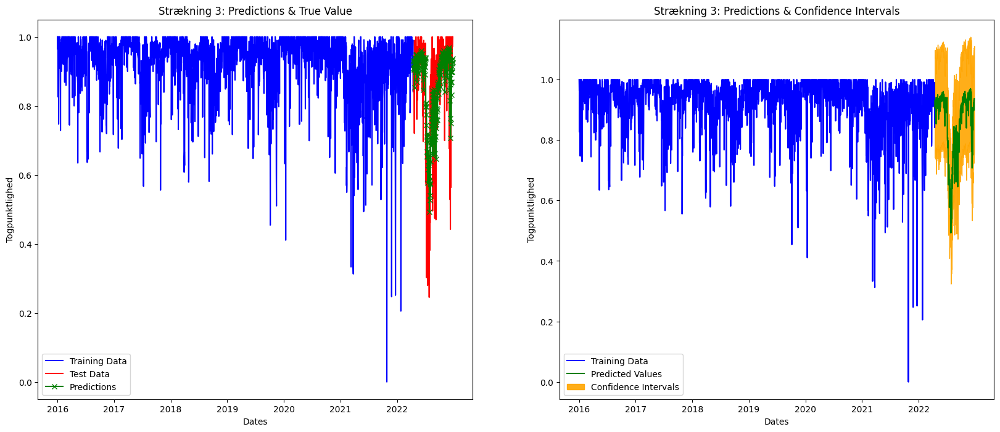

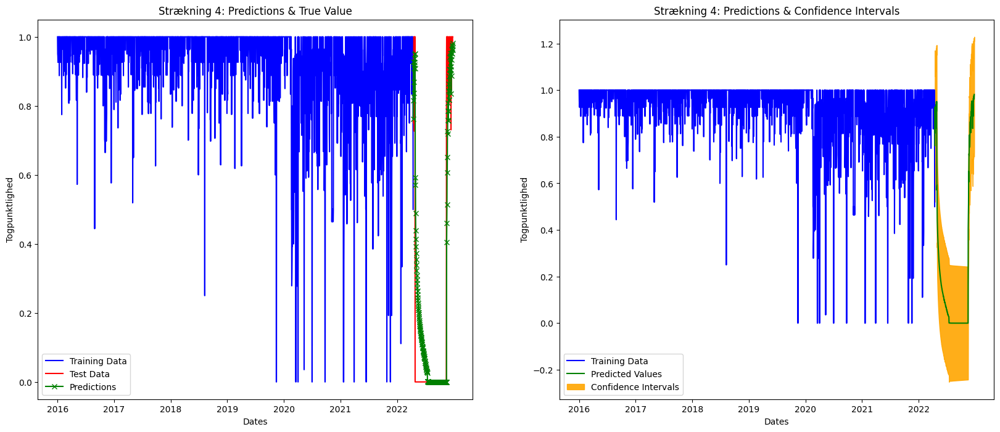

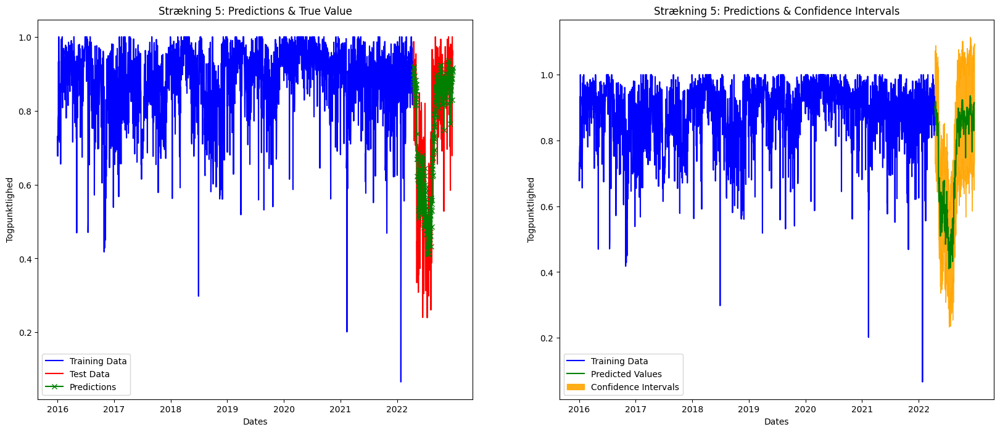

...

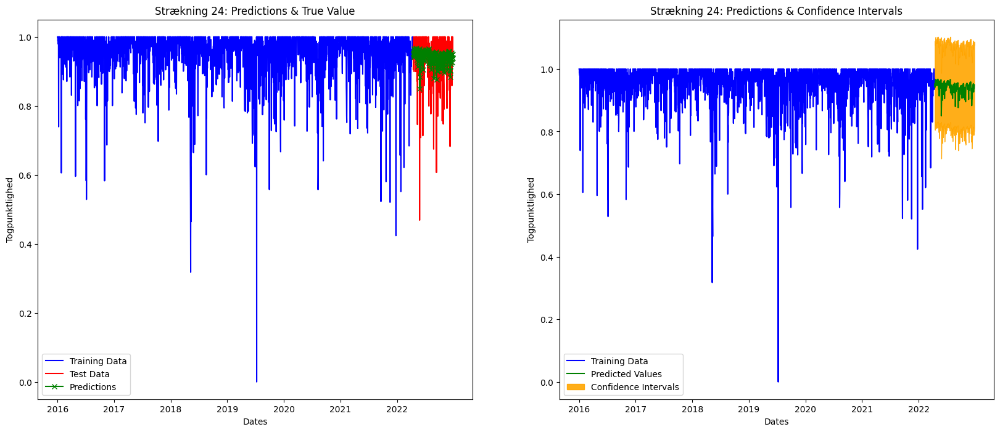

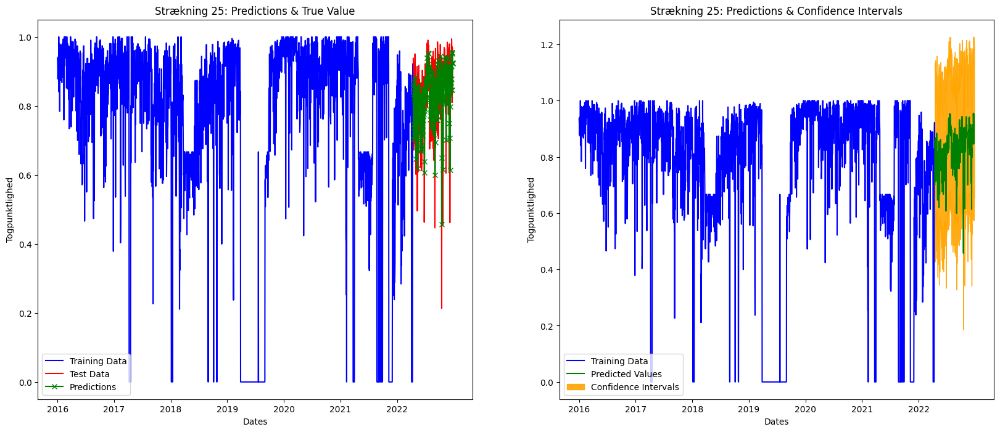

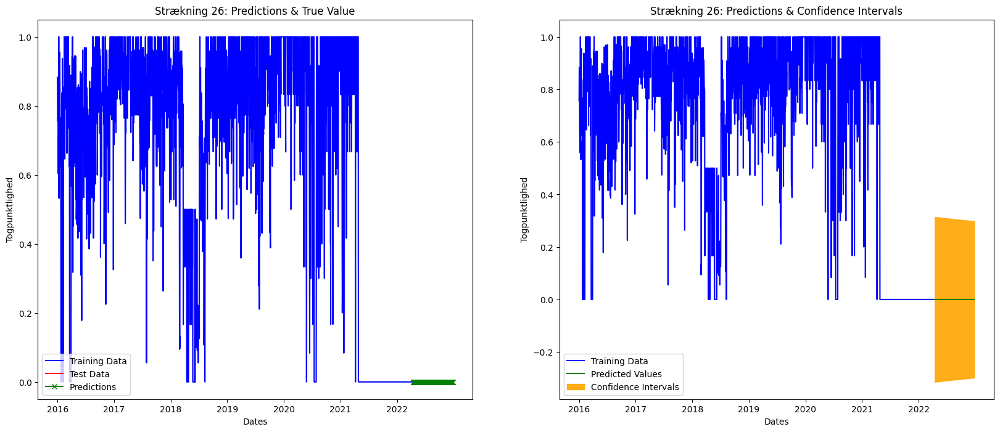

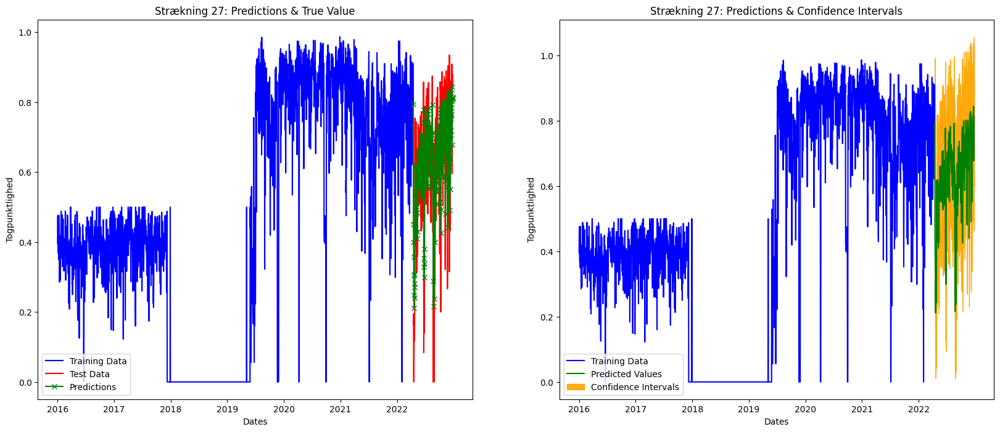

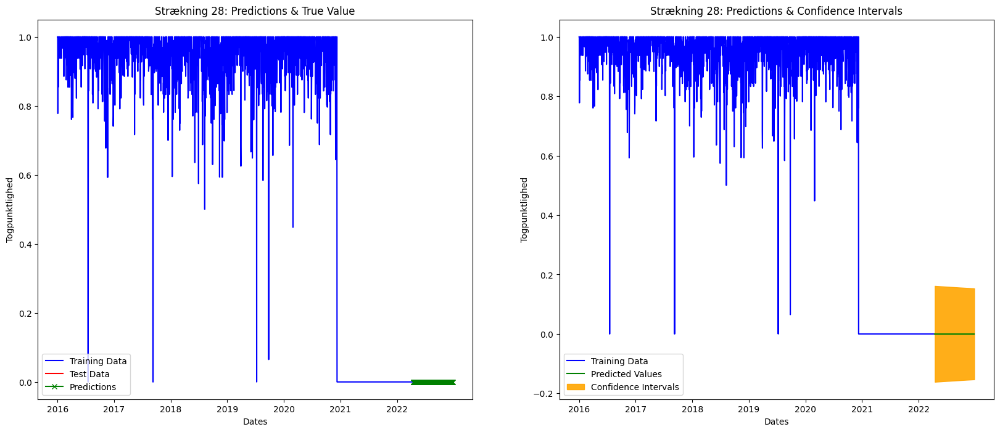

In [6]:
for strækning, results in data_each_strækning.items():
    y_train, y_test, forecasts, confidence_intervals, _, _, _ = results
    plotting_results(strækning, y_train, y_test, forecasts, confidence_intervals)

# Per station

In [118]:
data_each_station = {}
for station in np.sort(data['station'].unique()):
    train, test = togpunktlighed_station_split(station, ratio=0.1)
    y_train, y_test = train['togpunktlighed'], test['togpunktlighed']

    model = pm.auto_arima(y_train, d=1, seasonal=False, stepwise=True,
                     suppress_warnings=True, error_action="ignore", max_p=6,
                     max_order=None, trace=True)
    forecasts = []
    confidence_intervals = []

    for new_ob in y_test:
        fc, conf = forecast_one_step()
        forecasts.append(fc)
        confidence_intervals.append(conf)
        
        # Updates the existing model with a small number of MLE steps
        model.update(new_ob)
    results = [y_train, y_test, forecasts, confidence_intervals, model, mean_squared_error(y_test, forecasts), smape(y_test, forecasts)]
    data_each_station[station] = results
    print(f"Mean squared error: {mean_squared_error(y_test, forecasts)}")

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=-3388.290, Time=1.97 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=-2816.246, Time=0.18 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=-3044.893, Time=0.13 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=-3272.572, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=-2818.246, Time=0.08 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=-3386.574, Time=0.94 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=-3382.256, Time=0.55 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=-3384.856, Time=1.61 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=-3386.158, Time=1.90 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=-3388.349, Time=0.50 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=-3377.786, Time=0.47 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=-3156.401, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=-3390.242, Time=0.20 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=-3274.507, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0

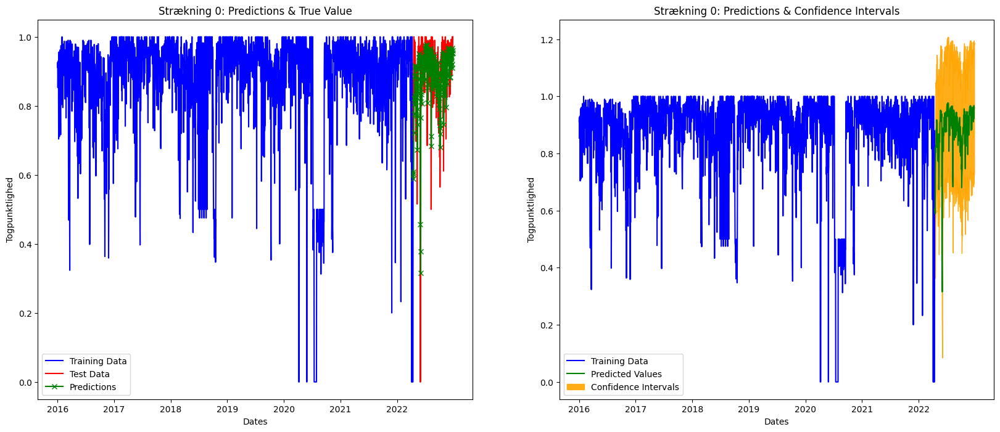

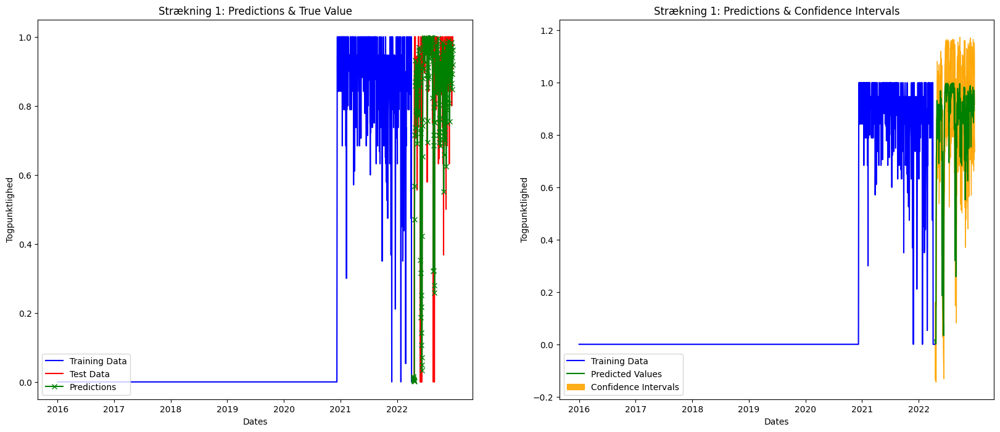

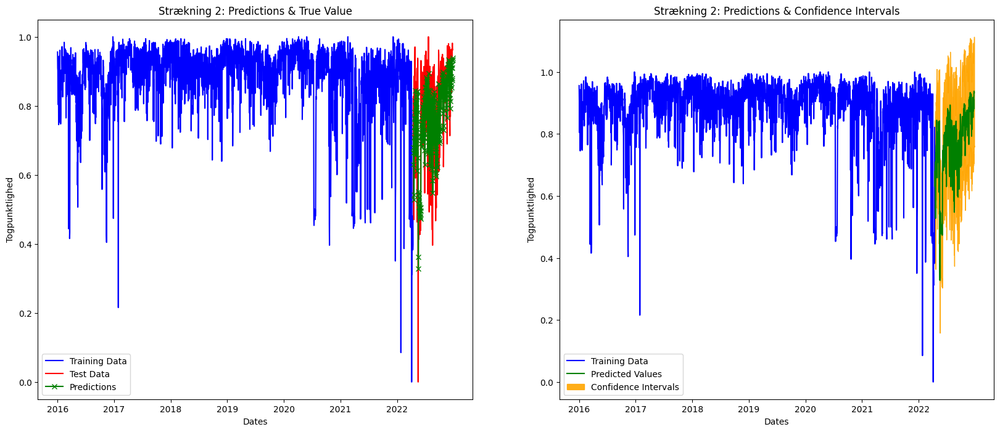

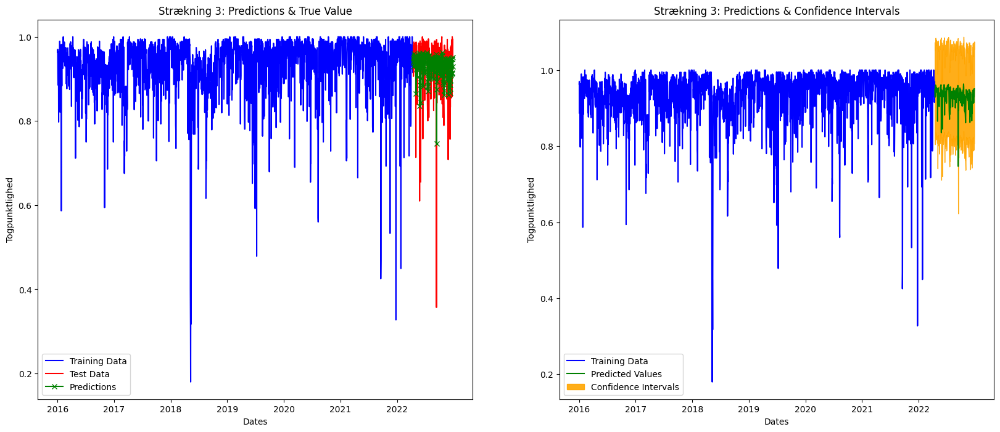

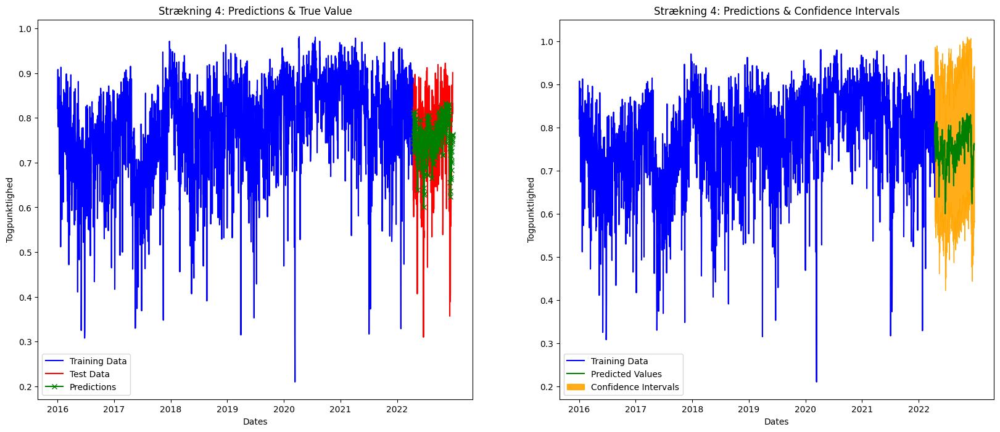

...

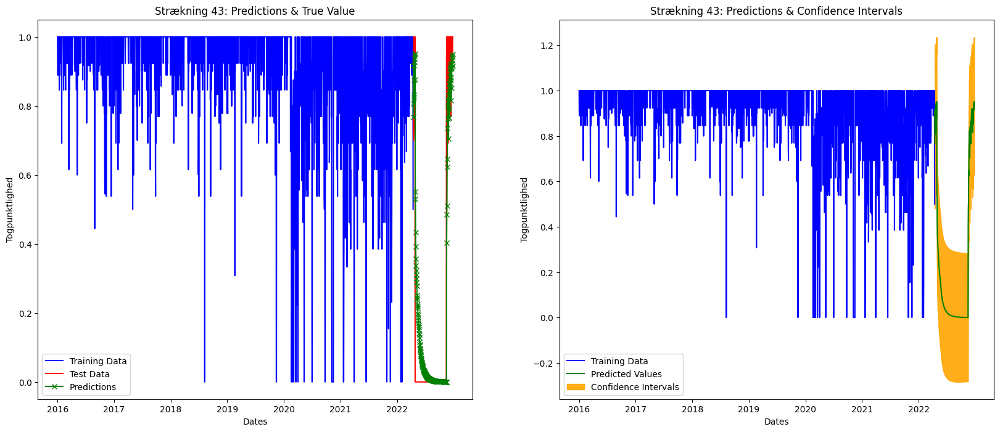

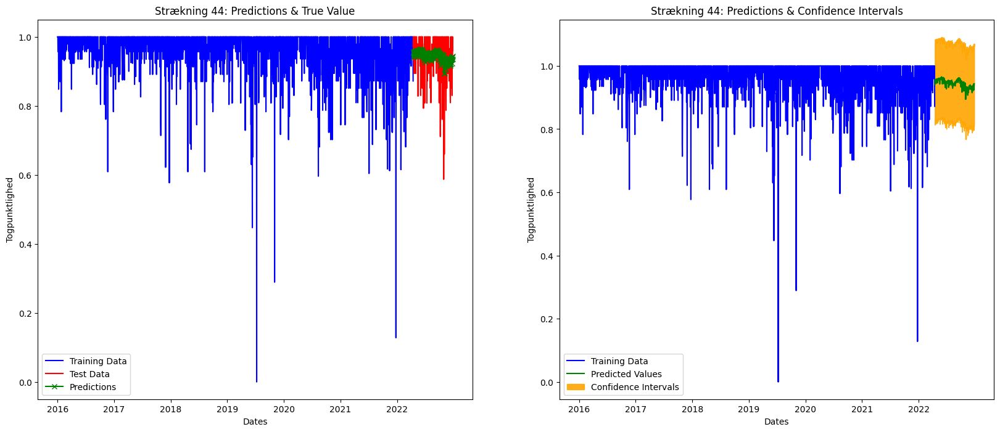

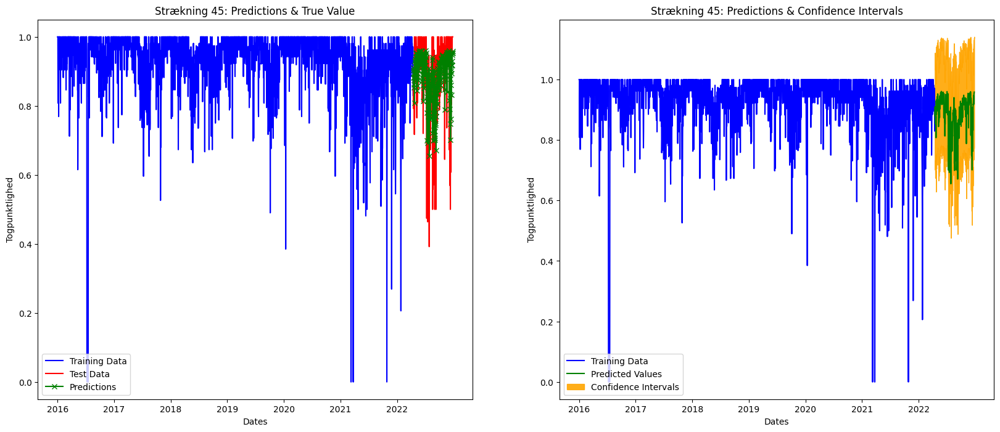

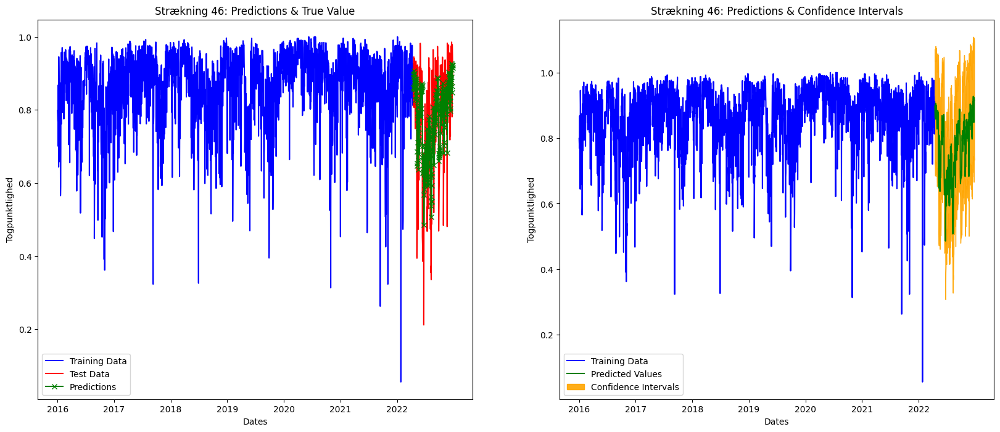

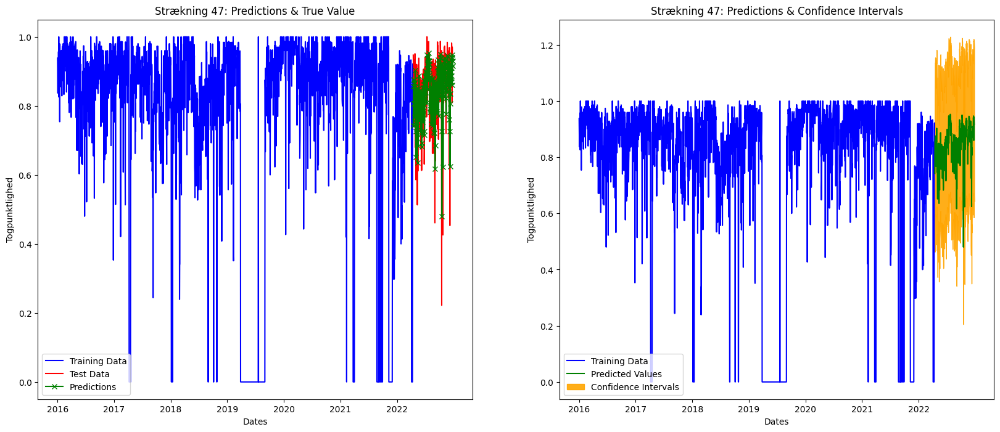

In [119]:
for station, results in data_each_station.items():
    y_train, y_test, forecasts, confidence_intervals, _, _, _ = results
    plotting_results(station, y_train, y_test, forecasts, confidence_intervals)

# Zero periods

In [122]:
y_train, y_test, *_ = data_each_strækning[4]

In [127]:
strækning4 = pd.concat([y_train,y_test])

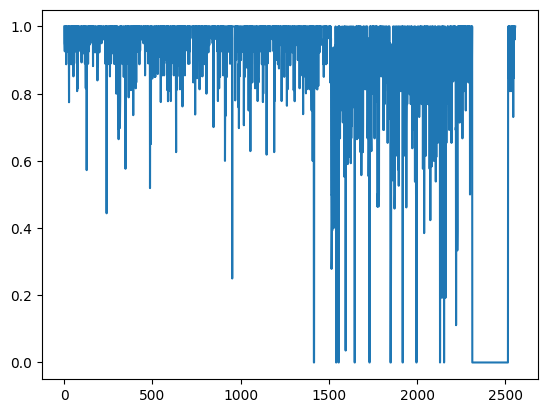

In [128]:
plt.plot(strækning4)

In [137]:
data[data['visualiseringskode'] == 4].groupby('dato').mean().iloc[-100:,:]

,togpunktlighed,koreplan_antal_planlagte_unik_tognr_togpkt_myldretid,koreplan_antal_planlagte_prod_kode_myldretid,koreplan_stdafv_antal_unik_prod_kode_per_time_myldretid,koreplan_antal_planlagte_unik_tognr_alle_myldretid,koreplan_stdafv_antal_unik_tognr_alle_per_time_myldretid,koreplan_antal_planlagte_unik_tognr_alle_g_meld_myldretid,koreplan_antal_planlagte_togfoelge_under_5_min_myldretid,koreplan_gns_planlagte_togfoelg_alle_min_myldretid,koreplan_stdafv_planlagte_togfoelg_alle_min_myldretid,...,dsb_tgf_fte,dsb_tgf_raadighed,dsb_tgf_sygdom,dsb_tgf_relative_sygdom,dsb_lkf_fte,dsb_lkf_sygdom,dsb_lkf_relative_sygdom,dsb_haandvaerker,dsb_fravaer,dsb_relative_fravaer
dato,,,,,,,,,,,,,,,,,,,,,
2022-09-23,0.0000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,...,0.0,0.00,0.0,0.0,21.0,3.700,0.088095,489.0,9.494,0.061649
2022-09-24,0.0000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,...,0.0,0.00,0.0,0.0,21.0,3.425,0.000000,489.0,5.494,0.035675
2022-09-25,0.0000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,...,0.0,0.00,0.0,0.0,21.0,4.340,0.000000,489.0,5.494,0.035675
2022-09-26,0.0000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,...,0.0,0.00,0.0,0.0,21.0,7.910,0.088095,489.0,10.008,0.064987
2022-09-27,0.0000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,...,0.0,1.65,0.5,0.0,21.0,6.975,0.088095,489.0,14.437,0.093747
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-27,1.0000,6.0,1.0,0.0,6.0,0.0,0.0,0.0,130.2,156.735,...,0.0,0.00,0.0,0.0,20.5,3.960,0.096585,493.0,9.343,0.059891
2022-12-28,1.0000,6.0,1.0,0.0,6.0,0.0,0.0,0.0,130.2,156.735,...,0.0,0.00,0.0,0.0,20.5,8.595,0.209634,493.0,11.343,0.072712
2022-12-29,0.9615,6.0,1.0,0.0,6.0,0.0,0.0,0.0,130.2,156.735,...,0.0,0.00,0.0,0.0,20.5,3.960,0.096585,493.0,11.343,0.072712


In [145]:
from datetime import datetime
datetime_str = '2022-09-26'
datetime_object = datetime.strptime(datetime_str, '%Y-%m-%d')


In [146]:
datetime_object

datetime.datetime(2022, 9, 26, 0, 0)

In [156]:
data_reset_index = data.reset_index()
result = data_reset_index[(data_reset_index['visualiseringskode'] == 4) & (data_reset_index['dato'] == datetime_object)]

In [157]:
result

,dato,togpunktlighed,koreplan_antal_planlagte_unik_tognr_togpkt_myldretid,koreplan_antal_planlagte_prod_kode_myldretid,koreplan_stdafv_antal_unik_prod_kode_per_time_myldretid,koreplan_antal_planlagte_unik_tognr_alle_myldretid,koreplan_stdafv_antal_unik_tognr_alle_per_time_myldretid,koreplan_antal_planlagte_unik_tognr_alle_g_meld_myldretid,koreplan_antal_planlagte_togfoelge_under_5_min_myldretid,koreplan_gns_planlagte_togfoelg_alle_min_myldretid,...,dsb_tgf_fte,dsb_tgf_raadighed,dsb_tgf_sygdom,dsb_tgf_relative_sygdom,dsb_lkf_fte,dsb_lkf_sygdom,dsb_lkf_relative_sygdom,dsb_haandvaerker,dsb_fravaer,dsb_relative_fravaer
191946,2022-09-26,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,8.42,0.00000,489.0,10.008,0.064987
191952,2022-09-26,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,42.0,7.40,0.17619,489.0,10.008,0.064987


# Cross-validation 

### Rolling Window CV

In [97]:
from pmdarima import model_selection

def cv_predict_plot(strækning, model, y, cv):
    import warnings
    warnings.filterwarnings('ignore')
    predictions = model_selection.cross_val_predict(estimator=model, y=y, cv=cv, verbose=0, averaging="median")

    # plot the predictions over the original series
    x_axis = np.arange(y.shape[0])
    n_test = predictions.shape[0]

    plt.plot(x_axis, y, alpha=0.75, c='b')
    plt.plot(x_axis[-n_test:], predictions, alpha=0.75, c='g')  # Forecasts
    plt.title(f"Strækning {strækning}: Cross-validated forecasts")
    plt.show()

def cv_score(strækning, model, y, cv):
    import warnings
    warnings.filterwarnings('ignore')
    model_cv_scores = model_selection.cross_val_score(
    model, y, scoring='smape', cv=cv, verbose=0)

    #print("Model CV scores: {}".format(model_cv_scores.tolist()))

    # Pick based on which has a lower mean error rate
    m_average_error = np.nanmean(model_cv_scores) # HVORFOR ER DET NØDVENDIGT
    error = m_average_error

    # print out the answer
    print("Strækning {}: Lowest average SMAPE: {}".format(
        strækning, error))
    return error

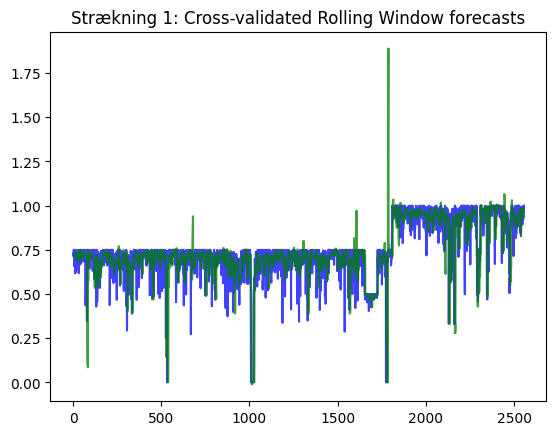

Strækning 1: Lowest average SMAPE: 11.245588347450173


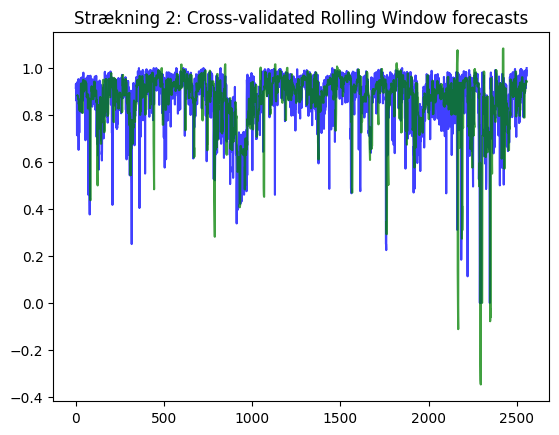

KeyboardInterrupt: 

In [151]:
smape_scores = []
for strækning, results in data_each_strækning.items():
    if strækning == 4:
        continue
    y_train, y_test, forecasts, confidence_intervals, model, _, _ = results
    y = pd.concat([y_train, y_test])
    cv = model_selection.SlidingWindowForecastCV(window_size=7, step=4, h=4)
    cv_predict_plot(strækning, model, y, cv)
    smape = cv_score(strækning, model, y, cv)
    smape_scores.append(smape)

In [74]:
smape_scores

[11.245588347450173,
 11.330654363136373,
 9.925428928876222,
 10.723664282597262,
 10.491575159267773,
 8.396159658643855,
 5.920180875906087,
 10.73378266068012,
 8.830483284290914,
 11.349912967660499,
 14.37772122008436,
 14.232031938201064,
 15.27023861916533,
 14.678636164955671,
 15.19527364502396,
 13.109724229542397,
 18.123596160604976,
 12.62159319298106,
 11.32328415482327,
 12.763942023024411,
 25.472795877129766,
 6.810862260270098,
 19.239414226112917,
 27.150868834255068,
 23.66180993357984,
 9.023461368412548]

In [94]:
y_train, y_test, forecasts, confidence_intervals, model, _, _ = data_each_strækning[4]
y = pd.concat([y_train, y_test])
cv = model_selection.SlidingWindowForecastCV(window_size=7, step=4, h=4)
cv_predict_plot(strækning, model, y, cv)
smape = cv_score(strækning, model, y, cv)
# En ande window size virker hvilket er underligt 

ValueError: Input contains NaN.

In [95]:
from sklearn.utils import assert_all_finite
try:
    assert_all_finite(y_test)
    print("Test passed: Array contains only finite values.")
except ValueError:
    print("Test failed: Array contains non-finite values.")

Test passed: Array contains only finite values.


In [81]:
sum(y_test.isna())

0

In [83]:
cv

SlidingWindowForecastCV(h=4, step=4, window_size=7)

In [82]:
model

ARIMA(order=(1, 1, 1), scoring_args={}, suppress_warnings=True,
      with_intercept=False)

### Expanding Window CV

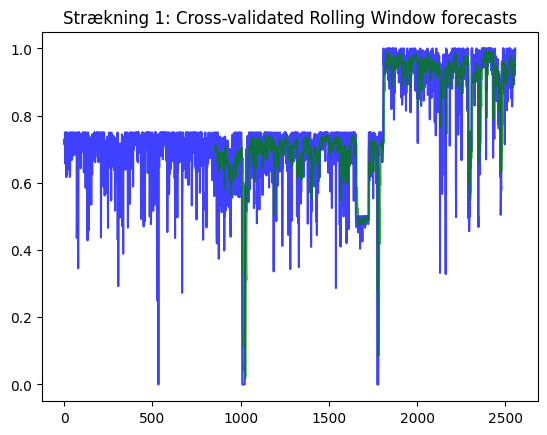

Strækning 1: Lowest average SMAPE: 10.882284684478995


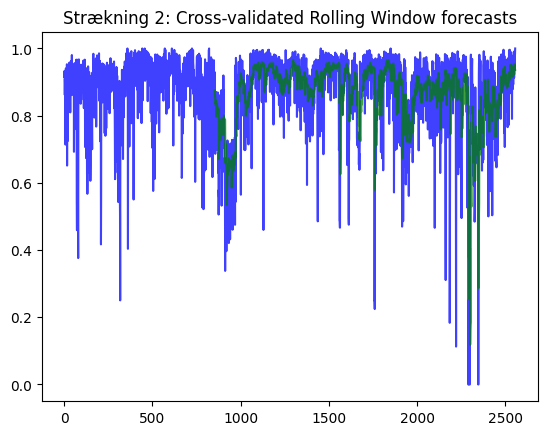

Strækning 2: Lowest average SMAPE: 10.017120288522305


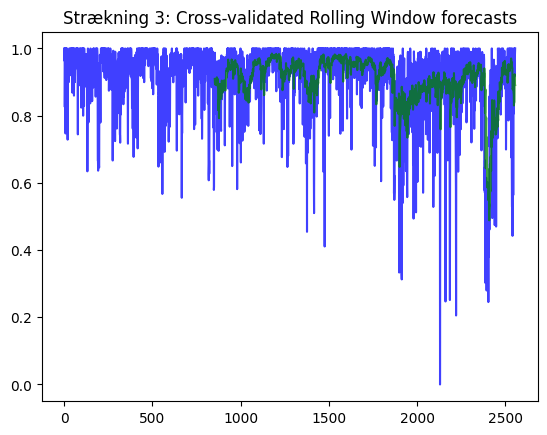

Strækning 3: Lowest average SMAPE: 8.197964501240715


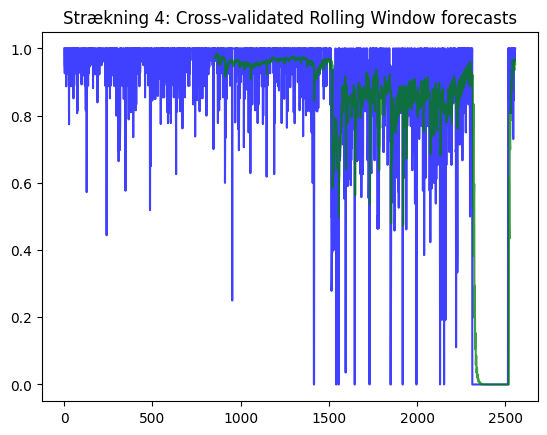

Strækning 4: Lowest average SMAPE: 36.19453424600407


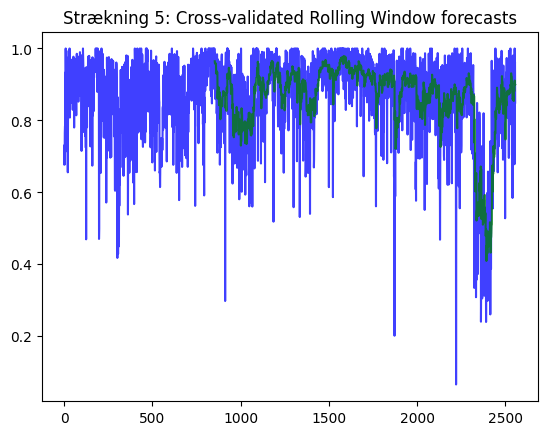

Strækning 5: Lowest average SMAPE: 8.973177064632742


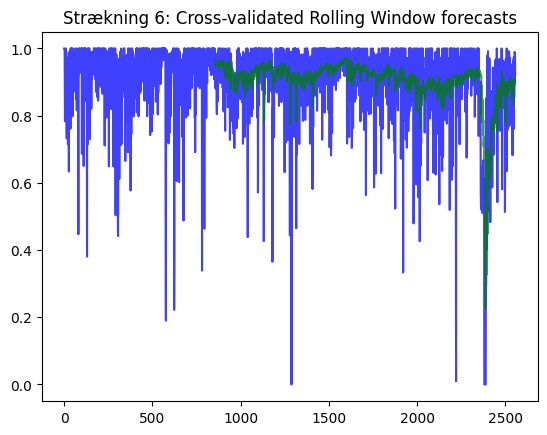

Strækning 6: Lowest average SMAPE: 9.435771707130554


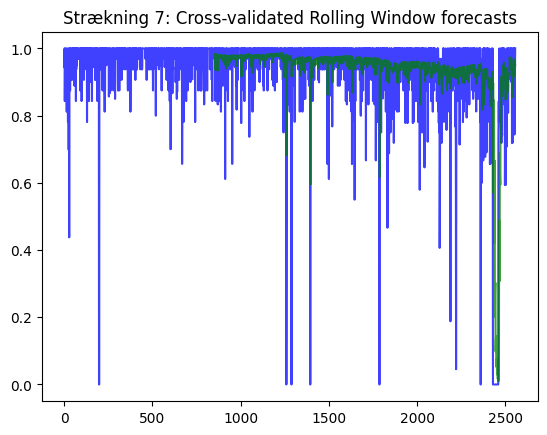

Strækning 7: Lowest average SMAPE: 10.821554294393868


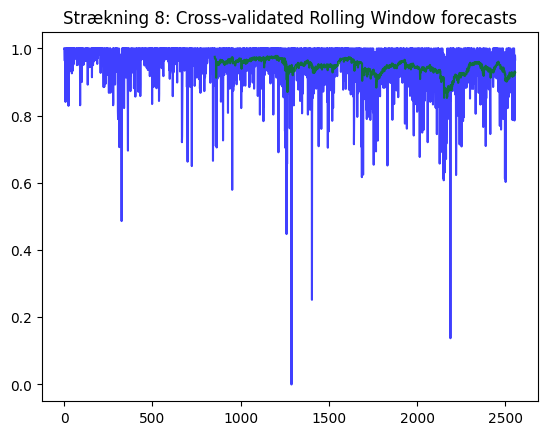

Strækning 8: Lowest average SMAPE: 5.441951052892659


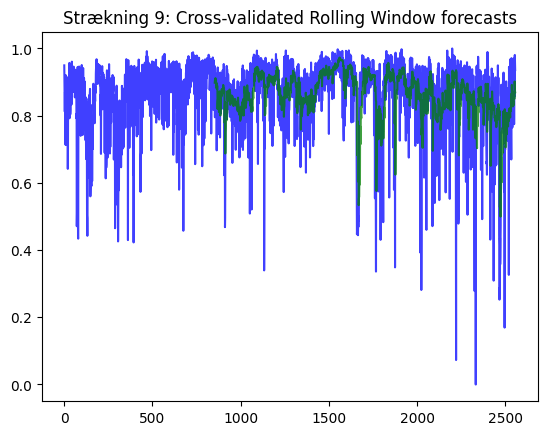

Strækning 9: Lowest average SMAPE: 8.938514572600617


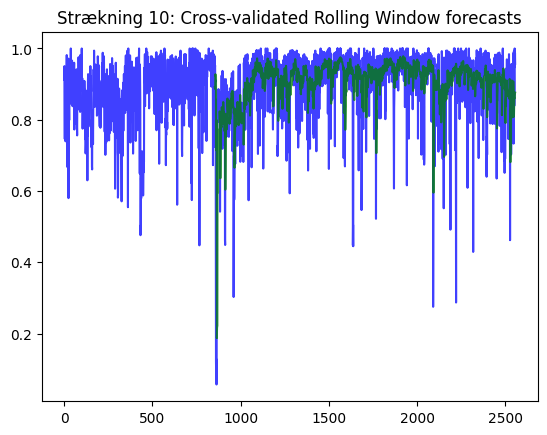

Strækning 10: Lowest average SMAPE: 7.21746447160766


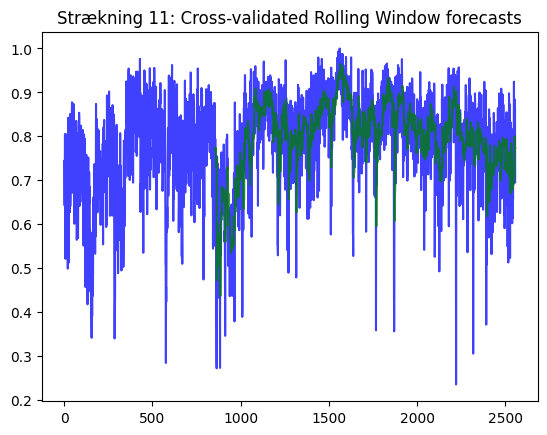

Strækning 11: Lowest average SMAPE: 8.498949163234363


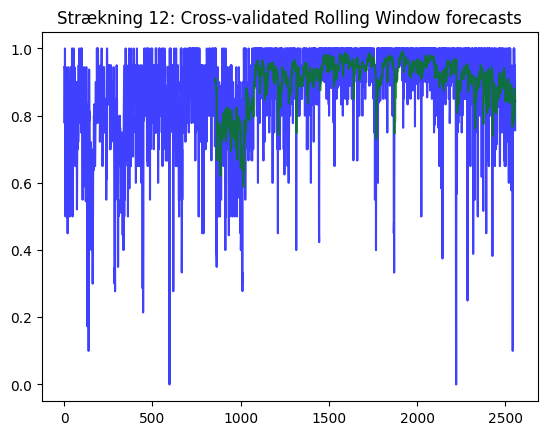

Strækning 12: Lowest average SMAPE: 9.487587284562725


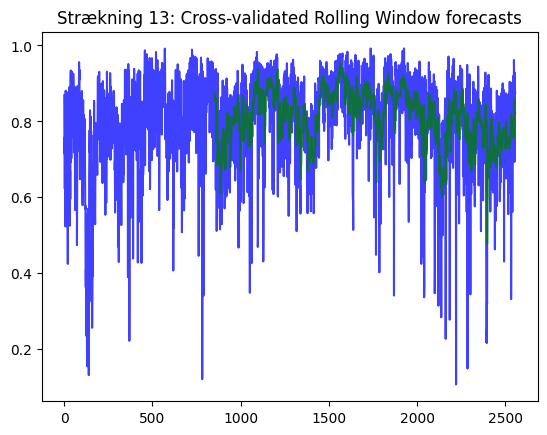

Strækning 13: Lowest average SMAPE: 10.124889966753745


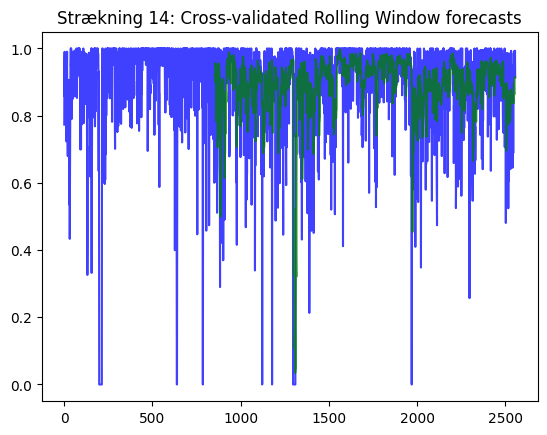

Strækning 14: Lowest average SMAPE: 12.886498923641167


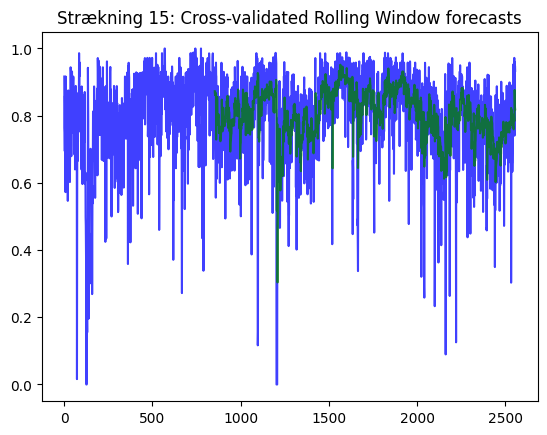

Strækning 15: Lowest average SMAPE: 11.168048812514911


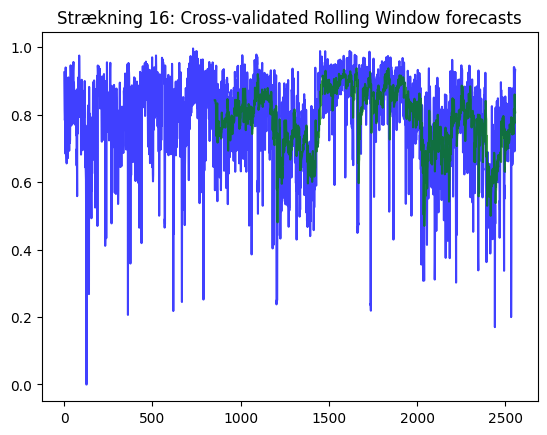

Strækning 16: Lowest average SMAPE: 11.733298209439948


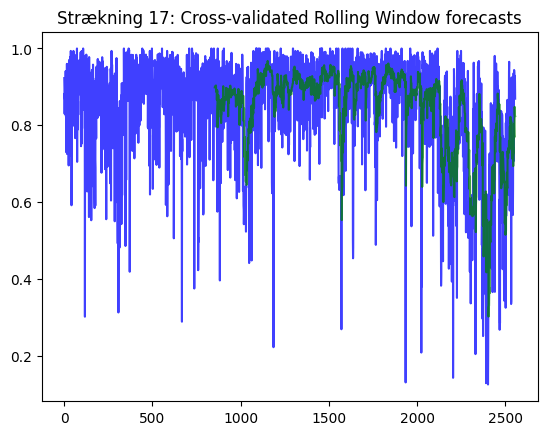

Strækning 17: Lowest average SMAPE: 10.942700512069685


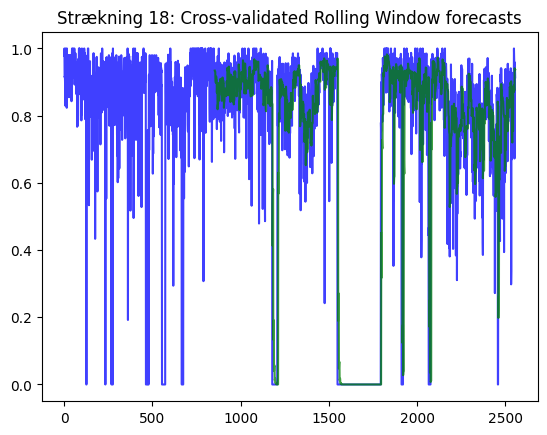

Strækning 18: Lowest average SMAPE: 44.35320409529069


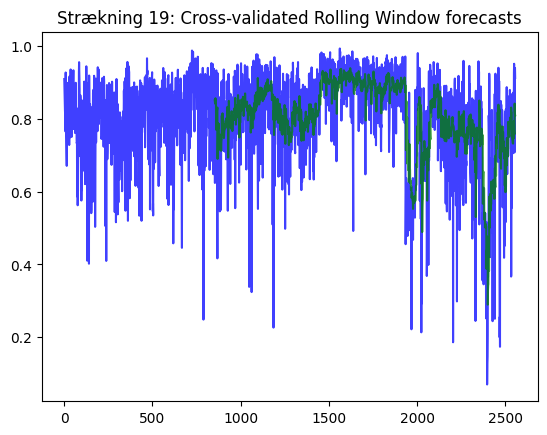

Strækning 19: Lowest average SMAPE: 10.379622129371885


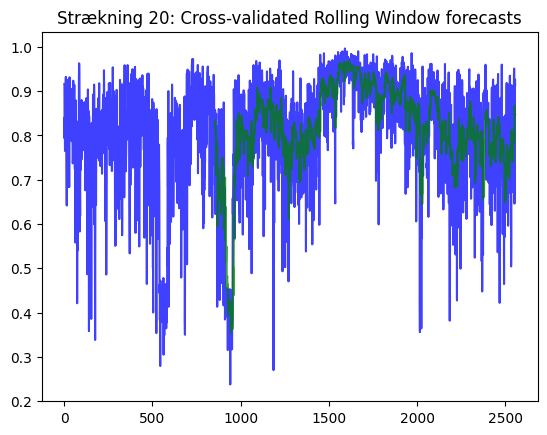

Strækning 20: Lowest average SMAPE: 8.441726893979906


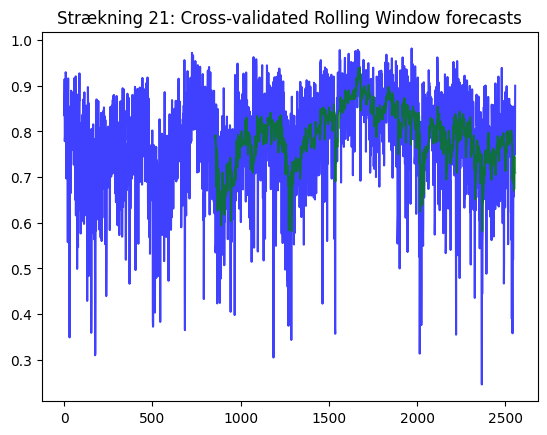

Strækning 21: Lowest average SMAPE: 9.641673383859978


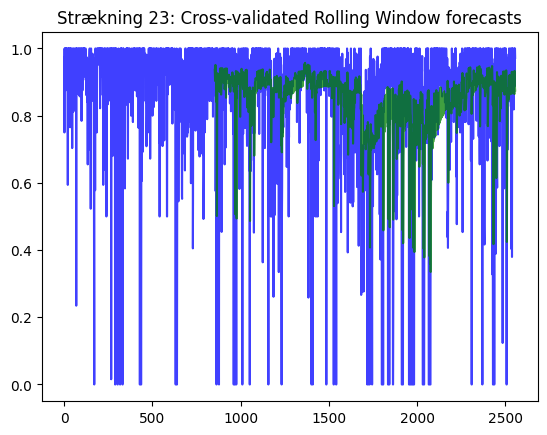

Strækning 23: Lowest average SMAPE: 23.045756026646483


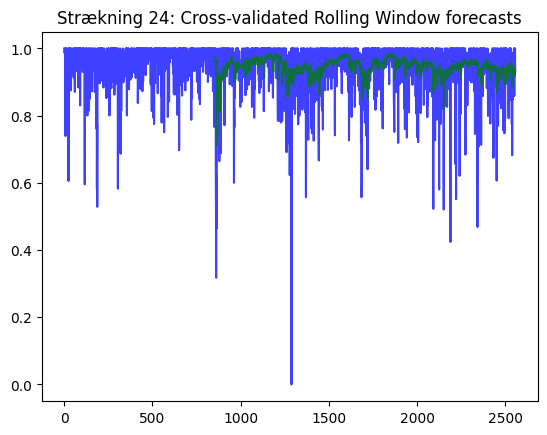

Strækning 24: Lowest average SMAPE: 5.729656151532804


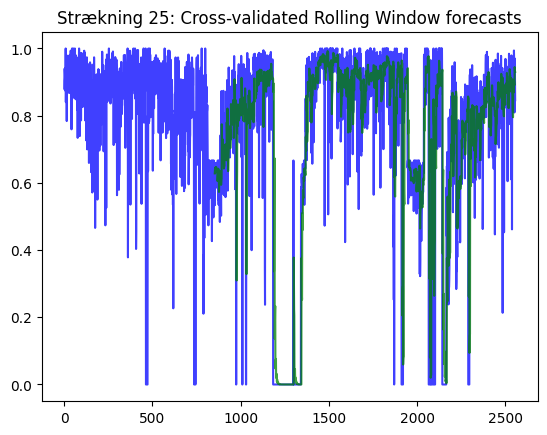

Strækning 25: Lowest average SMAPE: 37.20588563189837


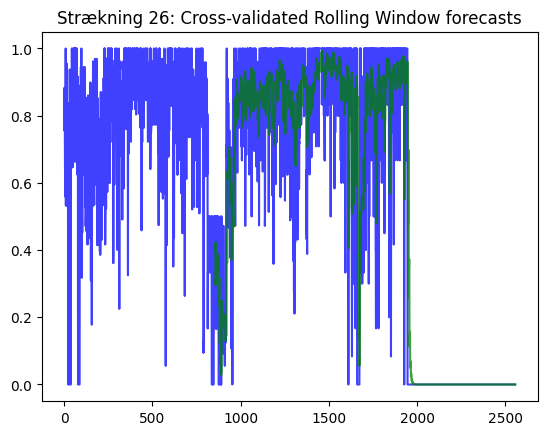

Strækning 26: Lowest average SMAPE: 87.12360628484089


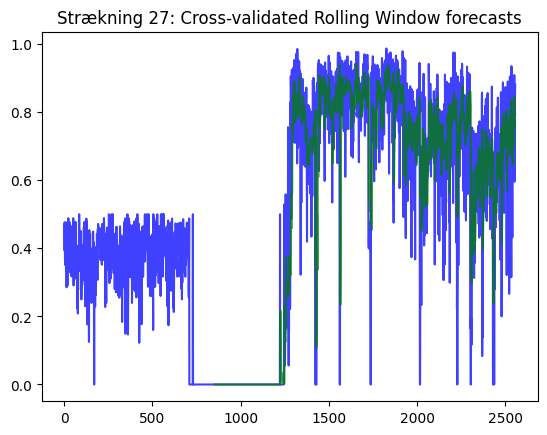

Strækning 27: Lowest average SMAPE: 61.018099774674916


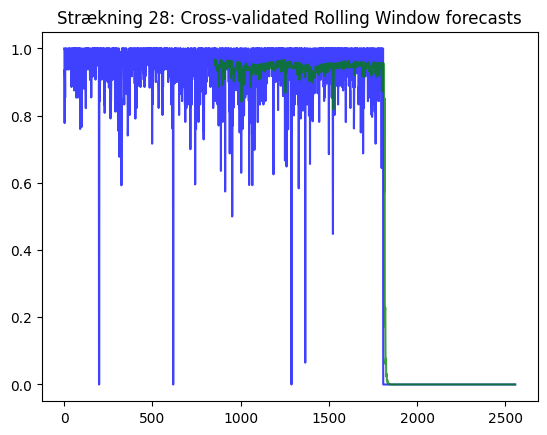

Strækning 28: Lowest average SMAPE: 91.37575013754527


In [101]:
from pmdarima import model_selection

smape_scores = []
for strækning, results in data_each_strækning.items():
    y_train, y_test, forecasts, confidence_intervals, model, _, _ = results
    y = pd.concat([y_train, y_test])
    cv = model_selection.RollingForecastCV(initial=100, step=1, h=1)
    cv_predict_plot(strækning, model, y, cv)
    smape = cv_score(strækning, model, y, cv)
    smape_scores.append(smape)

### Time Series Split Cross-validation

In [125]:
data_each_strækning

{}

In [130]:
from sklearn.model_selection import TimeSeriesSplit
from pmdarima import model_selection

tscv = TimeSeriesSplit(n_splits=5)

smape_scores = []
mse_mean_strækning = {}
for strækning, results in data_each_strækning.items():
    y_train, y_test, _, _, model, _, _ = results
    y = pd.concat([y_train, y_test])

    mse_strækning = []
    for train_index, test_index in tscv.split(y):
        y_train, y_test = y[train_index], y[test_index]
  
        forecasts = []

        for new_ob in y_test:
            fc, _ = forecast_one_step()
            forecasts.append(fc)            
            # Updates the existing model with a small number of MLE steps
            model.update(new_ob)
        
        print(1)
        mse = mean_squared_error(y_test, forecasts)
        mse_strækning.append(mse)
    mse_mean_strækning[strækning] = mse_strækning
    print(strækning)
# 3 hours runtime.

1
1
1
1
1
1
1
1
1
1
1
2
1
1
1
1
1
3
1
1
1
1
1
4
1
1
1
1
1
5
1
1
1
1
1
6
1
1
1
1
1
7
1
1
1
1
1
8
1
1
1
1
1
9
1
1
1
1
1
10
1
1
1
1
1
11
1
1
1
1
1
12
1
1
1
1
1
13
1
1
1
1
1
14
1
1
1
1
1
15
1
1
1
1
1
16
1
1
1
1
1
17
1
1
1
1
1
18
1
1
1
1
1
19
1
1
1
1
1
20
1
1
1
1
1
21
1
1
1
1
1
23
1
1
1
1
1
24
1
1
1
1
1
25
1
1
1
1
1
26
1
1
1
1
1
27
1
1
1
1
1
28


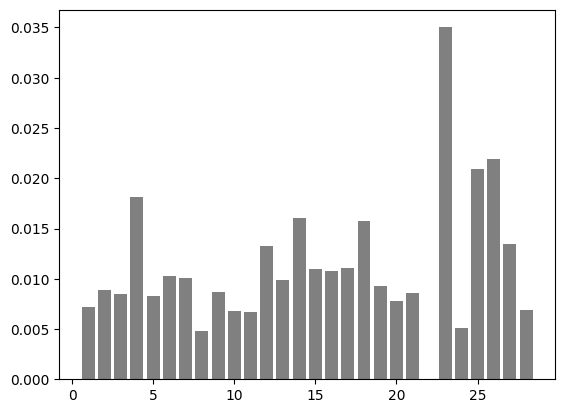

In [141]:
resulting_mse = pd.DataFrame()
for strækning, mse in mse_mean_strækning.items():
    resulting_mse[strækning] = [np.mean(mse)]
    plt.bar(strækning, np.mean(mse), color = 'gray')

In [145]:
resulting_mse.to_csv('Data/MSE_for_Time_Series_Split_CV.csv')

# Save prediction for RF

In [153]:
error_station = pd.DataFrame()
for station, results in data_each_station.items():
    y_train, y_test, forecasts, confidence_intervals, _, _, _ = results
    error_station[station] = forecasts - y_test
error_station.to_csv('Data/SARIMA_station_errors.csv')

In [154]:
errors_strækning = pd.DataFrame()
for strækning, results in data_each_strækning.items():
    y_train, y_test, forecasts, confidence_intervals, _, _, _ = results
    errors_strækning[strækning] = forecasts - y_test
errors_strækning.to_csv('Data/SARIMA_strækning_errors.csv')